# 실험 내용:
 ### grand_challenge의 lung CT데이터를 가지고 image segmentation을 해보았습니다.4명중 1명의 환자 CT 에만 정답 레이블(mask)가 있고 나머지 3명의 환자 Dataset에는 정답 레이 블이 없습니다.그러므로 첫번째 실험은 정답레이블이 있는 환자의 dataset을 가지고 lung segmentation을 해보았습니다.
 
 
 
 
 ##  1.grand_challenge lungCT 데이터를 읽어옵니다.  

In [1]:
import cv2
import os
import skimage.io as io
import matplotlib.pyplot as plt
import numpy as np
from sklearn.model_selection import train_test_split
%matplotlib inline


SEED=42
imgs = io.imread('C://lumic_grandchell_dataset//train//010_train_pre_contrast_2mm.mhd', plugin='simpleitk')
masks = io.imread('C://lumic_grandchell_dataset//train//train_mask.mhd', plugin='simpleitk')
test_imgs = io.imread('C://lumic_grandchell_dataset//test//test_post_contrast.mhd', plugin='simpleitk')
mmasks = io.imread('C://lumic_grandchell_dataset//test//test_mask.mhd', plugin='simpleitk')

In [2]:
x_train=[]
y_train=[]
x_test = []
y_test =[]
x_val=[]
y_val=[]


#기존 영상의 크기는 512x512 영상의료이미지입니다.이미지를 줄이기 위해서 resize함수를 씁니다. 
x_train = [cv2.resize(img, dsize=(128,128),interpolation=cv2.INTER_LANCZOS4) for img in imgs]
y_train = [cv2.resize(mask, dsize=(128,128),interpolation=cv2.INTER_LANCZOS4) for mask in masks]
x_test = [cv2.resize(test_img, dsize=(128,128),interpolation=cv2.INTER_LANCZOS4) for test_img in test_imgs]
y_test =[cv2.resize(mmask, dsize=(128,128),interpolation=cv2.INTER_LANCZOS4) for mmask in mmasks]


x_train = np.array(x_train, dtype=np.float32)
y_train = np.array(y_train, dtype=np.float32)
x_test=np.array(x_test,dtype=np.float32)
y_test=np.array(y_test,dtype=np.float32)


print(x_train.shape,y_train.shape,x_test.shape,y_test.shape)


#검증하기위해 모든 학습데이터의 20%를  검증데이터로 주었습니다.
x_train,x_val,y_train,y_val = train_test_split(x_train, y_train, test_size =0.2)

x_val = np.array(x_val)
y_val = np.array(y_val)


print(x_train.shape,y_train.shape,x_test.shape,y_test.shape,x_val.shape,y_val.shape)


(286, 128, 128) (286, 128, 128) (286, 128, 128) (286, 128, 128)
(228, 128, 128) (228, 128, 128) (286, 128, 128) (286, 128, 128) (58, 128, 128) (58, 128, 128)


## 2.정답레이블이 있는 환자의 lungCT 영상과 마스크 이미지를 보여줍니다.

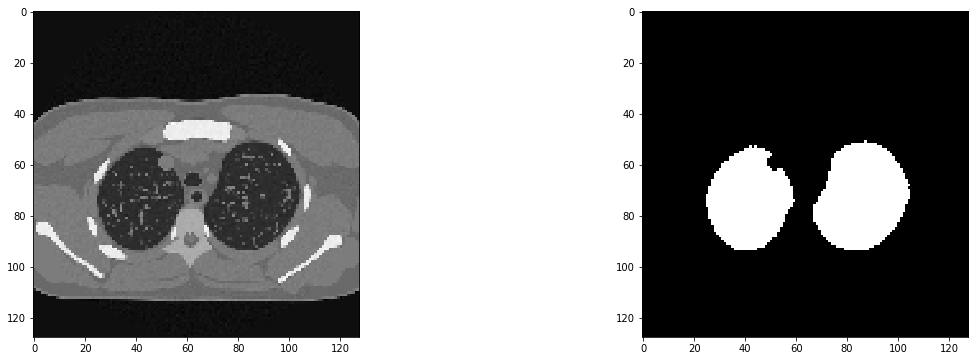

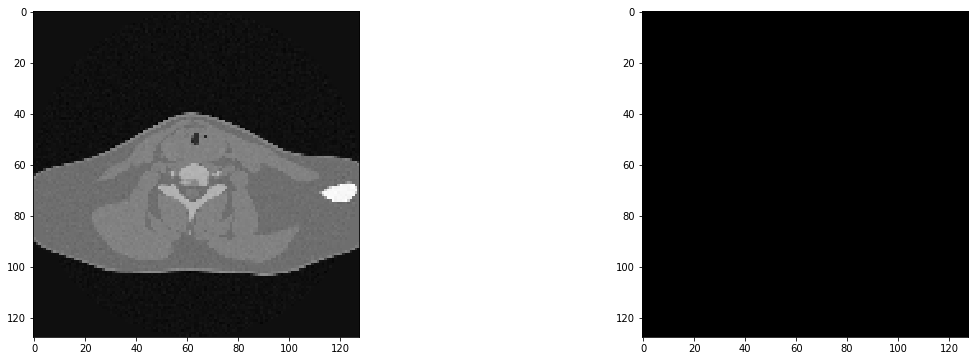

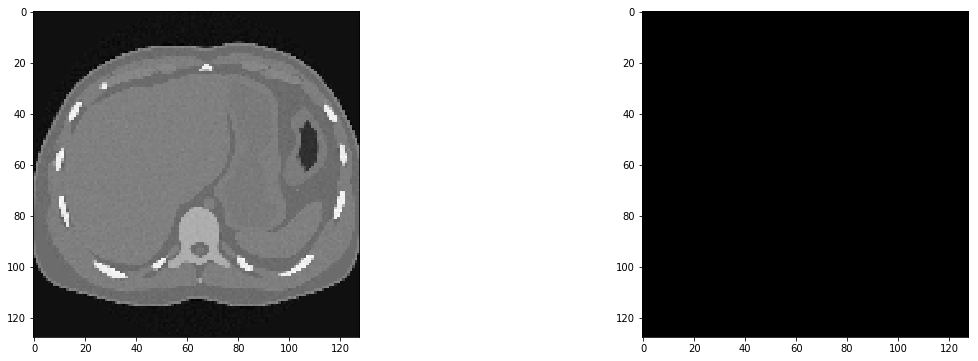

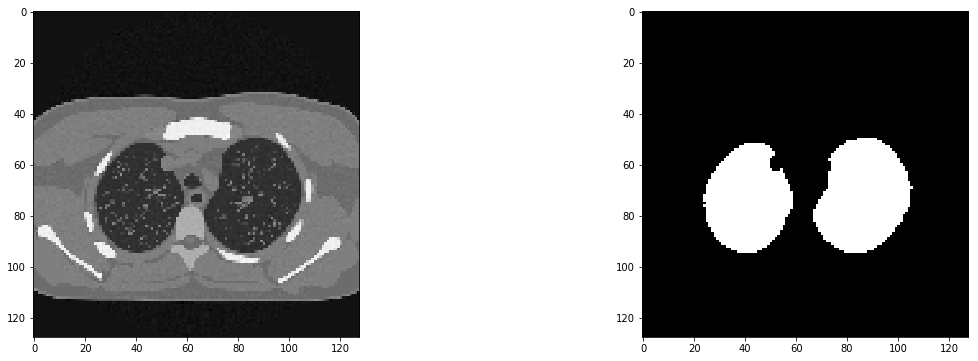

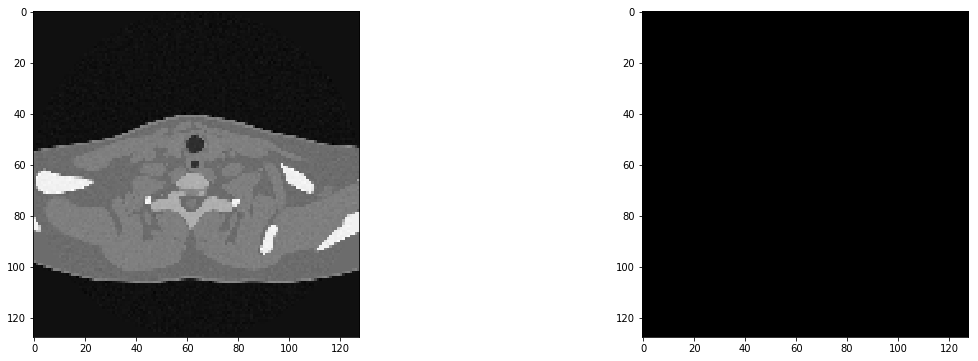

...

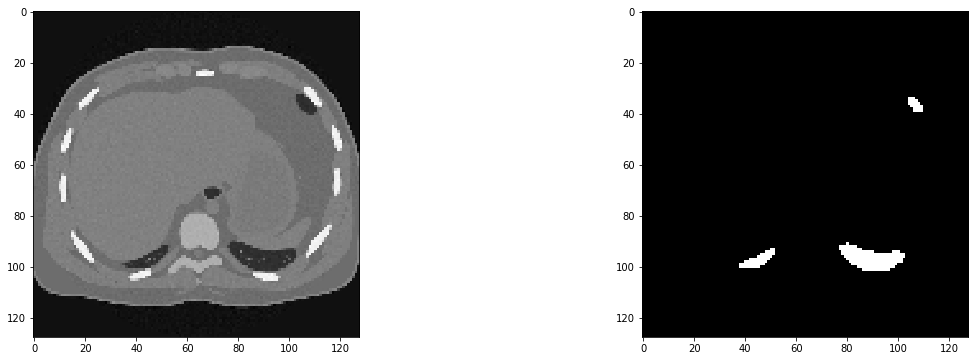

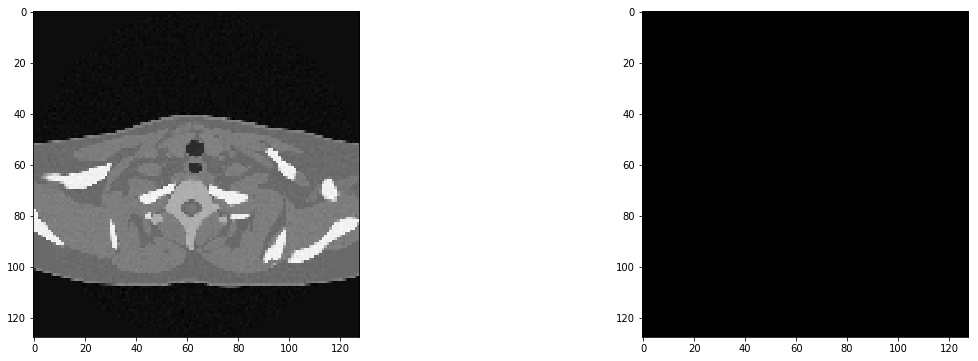

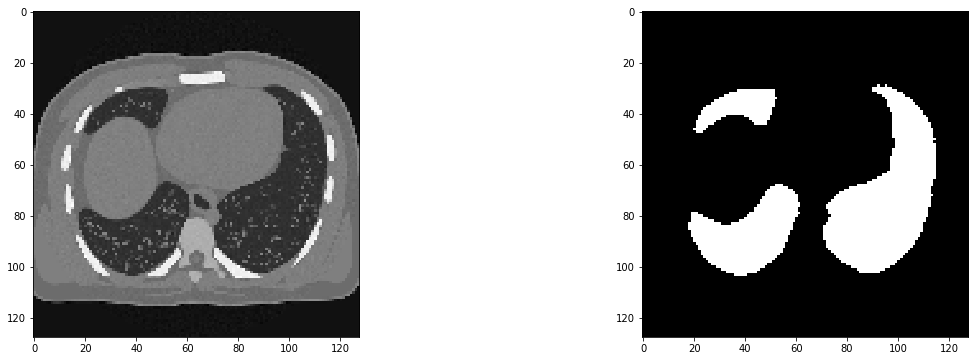

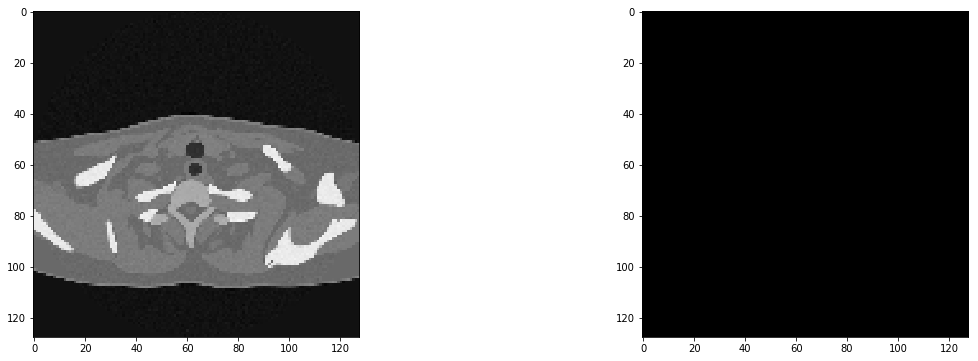

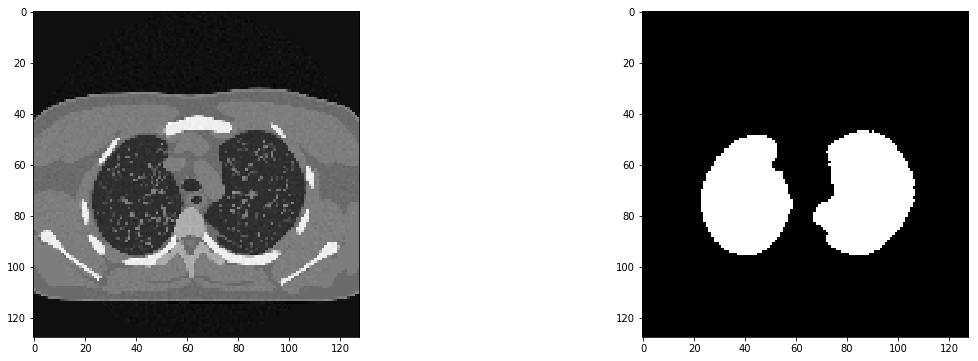

In [3]:
%matplotlib inline
import matplotlib.pyplot as plt

for i in range(0,x_train.shape[0],10):
    plt.figure(figsize=(20, 6))
    plt.subplot(1, 2, 1)
    plt.imshow(x_train[i],'gray')
    plt.subplot(1, 2, 2)
    plt.imshow(y_train[i],'gray')    
    plt.show()

## 3.의료데이터셋은 일반 이미지와 다른 밝기 값을 가지므로 의료데이터셋에 전처리, 
## 스케일링을 적용해줍니다.

In [4]:

x_train = x_train.astype('float32')
x_test =x_test.astype('float32')
x_val=x_val.astype('float32')


center = -400
width = 1500

low = center - width / 2
high = center + width / 2


x_train = (x_train-low) / (high-low)
x_train[x_train < 0.] = 0.
x_train[x_train > 1.] = 1.

x_val = (x_val-low) / (high-low)
x_val[x_val < 0.] = 0.
x_val[x_val > 1.] = 1.

x_test = (x_test-low) / (high-low)
x_test[x_test < 0.] = 0.
x_test[x_test > 1.] = 1.


train_std = np.std(x_train)
train_mean = np.mean(x_train)
test_std = np.std(x_test)
test_mean = np.mean(x_test)
val_std = np.std(x_val)
val_mean = np.mean(x_val)
print(train_mean,train_std,test_mean,test_std,val_std,val_mean)

x_train -= train_mean
x_train /= train_std
x_test -= test_mean
x_test /= test_std
x_val -= val_mean
x_val /= val_std




y_train[y_train < 0.] = 0.
y_train[y_train > 1.] = 1.

y_val[y_val < 0.] = 0.
y_val[y_val > 1.] = 1.

y_test[y_test < 0.] = 0.
y_test[y_test > 1.] = 1.

0.47180498 0.32699 0.4810989 0.33395082 0.32541105 0.4818243


## 4.전처리전과 전처리후의 이미지를 눈으로 쉽게 비교하기위해서 전처리 전의 이미지와 전처리후 이미지를  저장하였습니다.

In [5]:
before=np.load('C:/lumic_grandchell_dataset/beforescailing/before.npy')

after=np.load('C:/lumic_grandchell_dataset/beforescailing/after.npy')

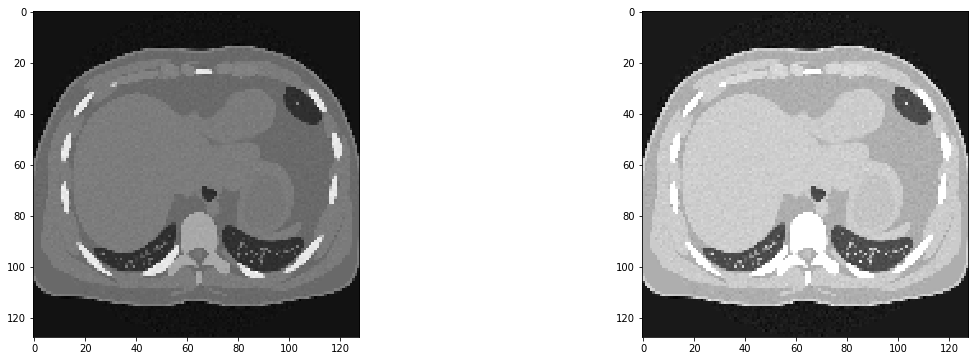

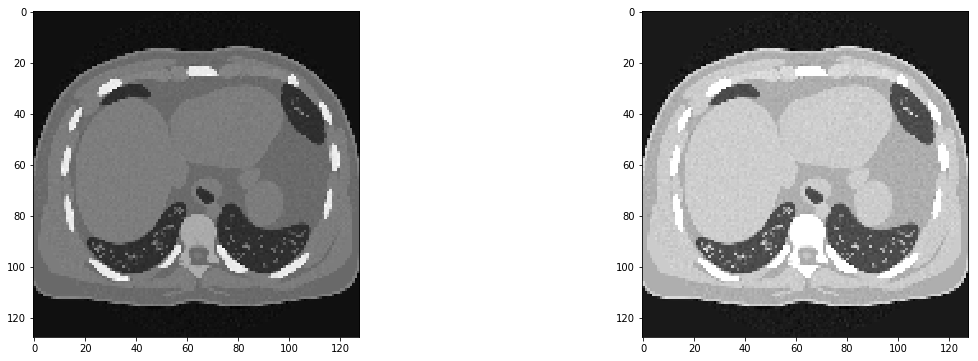

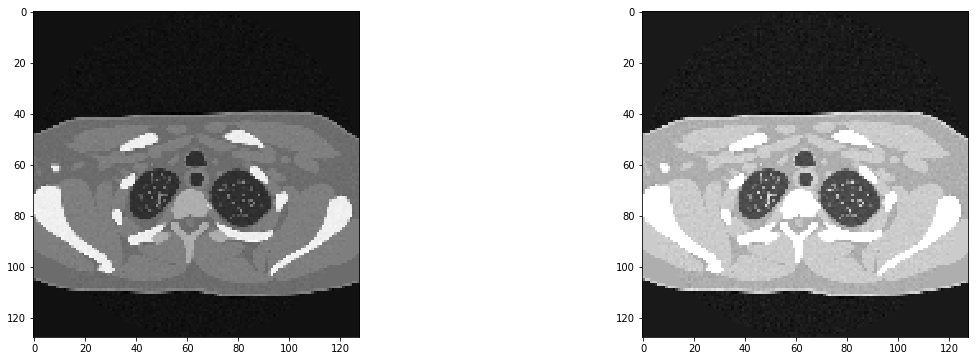

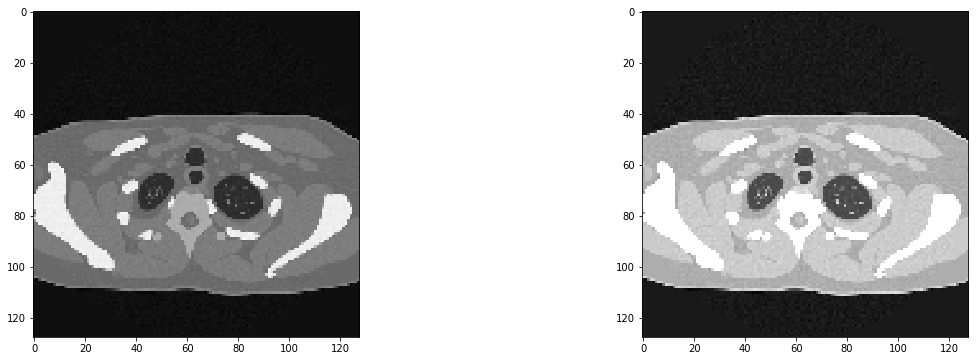

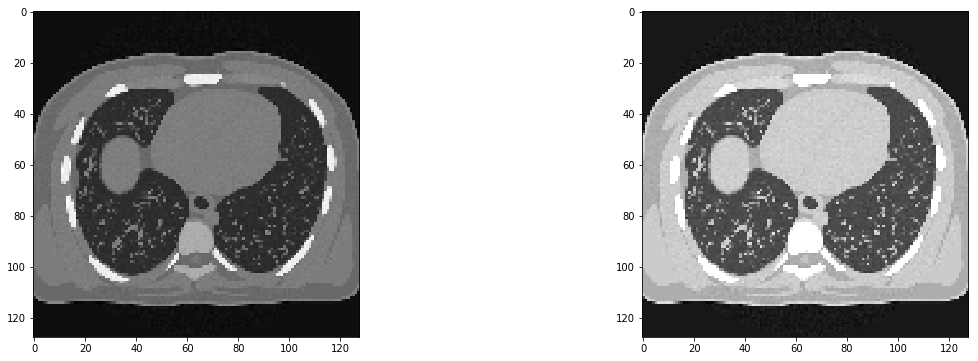

...

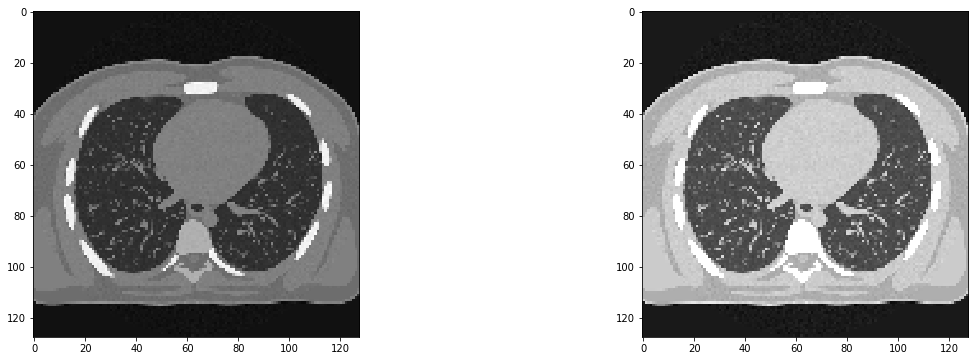

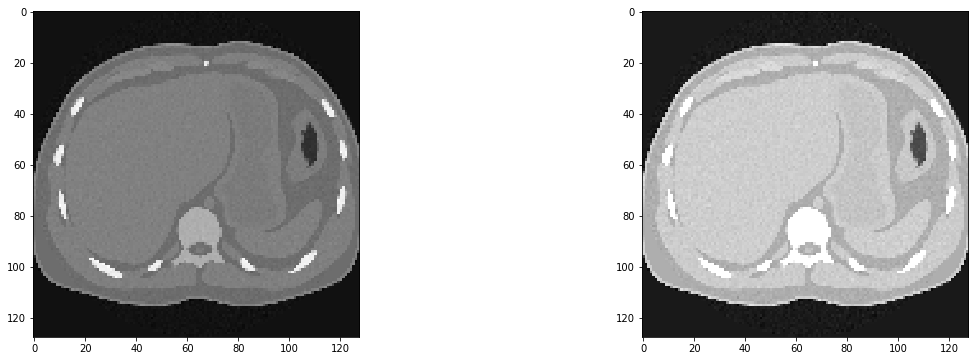

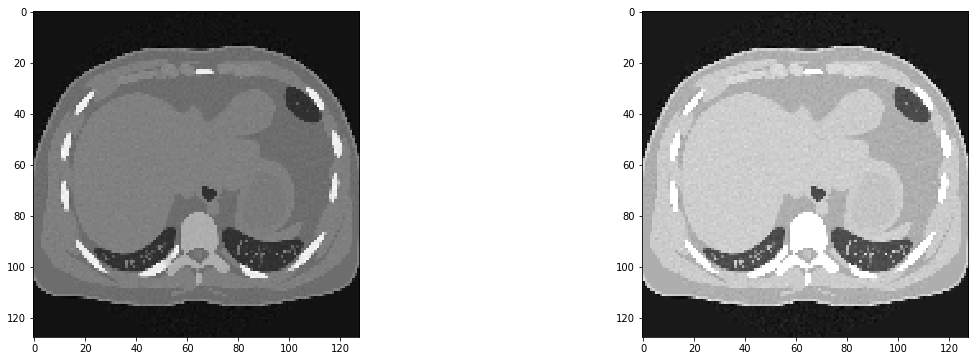

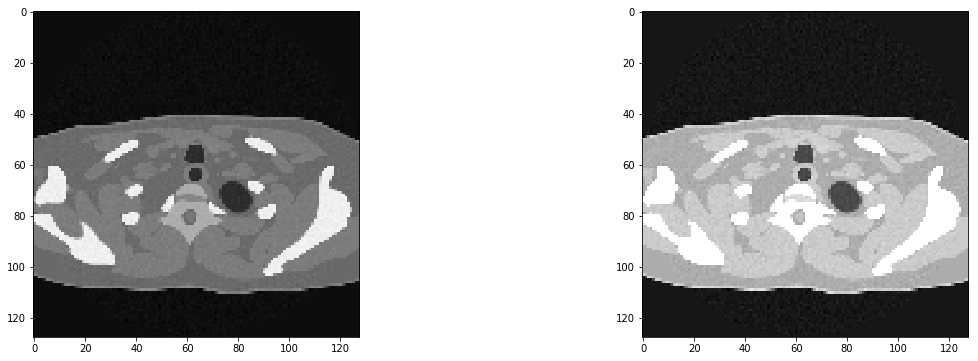

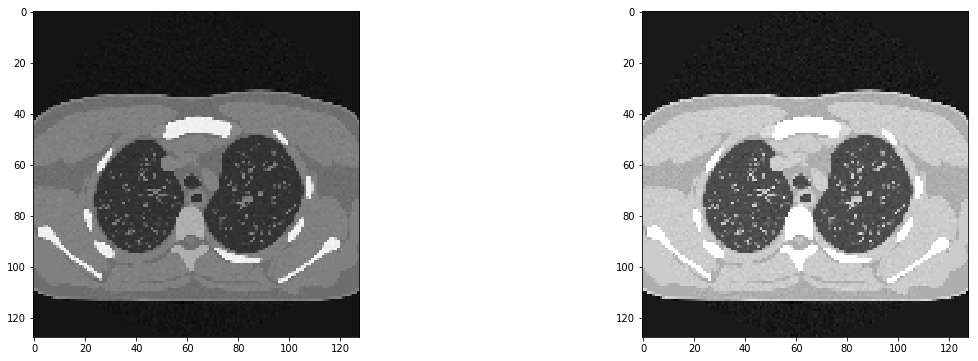

In [6]:
#왼쪽이 전처리전, 오른쪽이 전처리 후 입니다.

%matplotlib inline
import matplotlib.pyplot as plt

for i in range(0,x_train.shape[0],10):
    plt.figure(figsize=(20, 6))
    plt.subplot(1, 2, 1)
    plt.imshow(before[i],'gray')
    plt.subplot(1, 2, 2)
    plt.imshow(after[i],'gray')    
    plt.show()

## 5.model
## 모델은 U-net을 사용했습니다. U-net은 이미지의 특정 영역을 표현하는 image segmentation에 주된 목적이 있는 모델입니다.

In [7]:
from keras.models import Model
from keras.layers import *
from keras.optimizers import Adam
from keras.regularizers import l2
from keras.preprocessing.image import ImageDataGenerator
import keras.backend as K
from keras.callbacks import LearningRateScheduler, ModelCheckpoint

input_layer = Input((128,128, 1))
c1 = Conv2D(filters=8, kernel_size=(3,3), activation='relu', padding='same')(input_layer)
l = MaxPool2D(strides=(2,2))(c1)
c2 = Conv2D(filters=16, kernel_size=(3,3), activation='relu', padding='same')(l)
l = MaxPool2D(strides=(2,2))(c2)
c3 = Conv2D(filters=32, kernel_size=(3,3), activation='relu', padding='same')(l)
l = MaxPool2D(strides=(2,2))(c3)
c4 = Conv2D(filters=32, kernel_size=(1,1), activation='relu', padding='same')(l)
l = concatenate([UpSampling2D(size=(2,2))(c4), c3], axis=-1)
l = Conv2D(filters=32, kernel_size=(2,2), activation='relu', padding='same')(l)
l = concatenate([UpSampling2D(size=(2,2))(l), c2], axis=-1)
l = Conv2D(filters=24, kernel_size=(2,2), activation='relu', padding='same')(l)
l = concatenate([UpSampling2D(size=(2,2))(l), c1], axis=-1)
l = Conv2D(filters=16, kernel_size=(2,2), activation='relu', padding='same')(l)
l = Conv2D(filters=64, kernel_size=(1,1), activation='relu')(l)
l = Dropout(0.5)(l)
output_layer = Conv2D(filters=1, kernel_size=(1,1), activation='sigmoid')(l)
                                                         
model = Model(input_layer, output_layer)

Using TensorFlow backend.


## 6.ImageDataGenerator를 사용하여 더 많은 데이터를 확보하였습니다.

In [8]:
def my_generator(x_train, y_train, batch_size):
    data_generator = ImageDataGenerator(
            width_shift_range=0.1,
            height_shift_range=0.1,
            rotation_range=10,
            zoom_range=0.1).flow(x_train, x_train, batch_size, seed=SEED)
    mask_generator = ImageDataGenerator(
            width_shift_range=0.1,
            height_shift_range=0.1,
            rotation_range=10,
            zoom_range=0.1).flow(y_train, y_train, batch_size, seed=SEED)
    while True:
        x_batch, _ = data_generator.next()
        y_batch, _ = mask_generator.next()
        yield x_batch, y_batch

In [9]:
x_train = x_train.reshape(-1,128,128,1)
y_train = y_train.reshape(-1,128,128,1)

x_test = x_test.reshape(-1,128,128,1)
y_test = y_test.reshape(-1,128,128,1)
x_val = x_val.reshape(-1,128,128,1)
y_val  = y_val.reshape(-1,128,128,1)

In [10]:
image_batch, mask_batch = next(my_generator(x_train, y_train, 3))

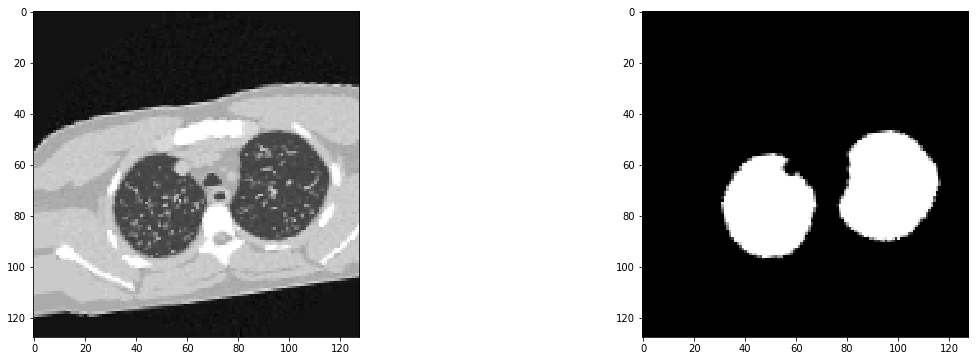

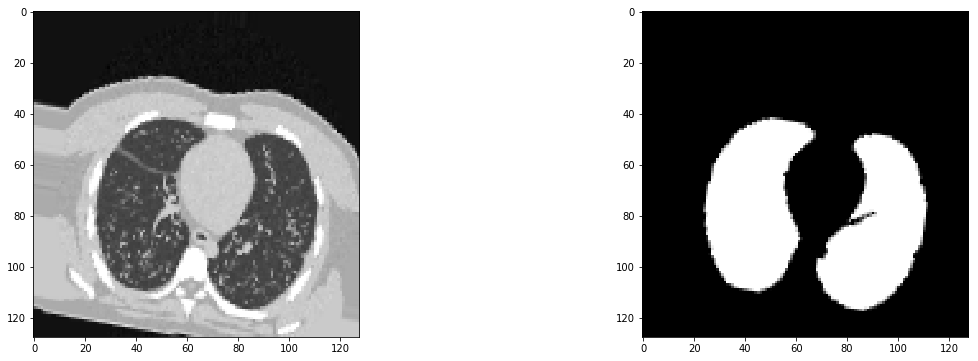

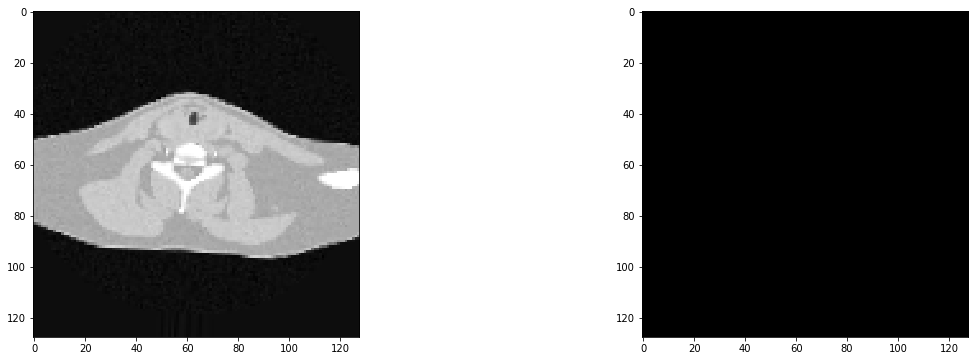

In [11]:
#왼쪽이 Data Augmentation전  Data Augmentation후입니다.

%matplotlib inline
import matplotlib.pyplot as plt

for i in range(len(image_batch)):
    plt.figure(figsize=(20, 6))
    plt.subplot(1, 2, 1)
    plt.imshow(image_batch[i,:,:,0],'gray')
    plt.subplot(1, 2, 2)
    plt.imshow(mask_batch[i,:,:,0],'gray')    
    plt.show()

## 7.실제 정답레이블과 예측해서 만든 레이블의 정확도를 측정하기 위해 dice_coef의 함수를 정의해줍니다.

In [12]:
def dice_coef(y_true, y_pred):
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    return (2. * intersection + K.epsilon()) / (K.sum(y_true_f) + K.sum(y_pred_f) + K.epsilon())

In [13]:
# 이때 loss 함수를 binary_crossentropy를 사용한 이유는 이미지의 픽셀값 0과 1을 구분하기 위해서 사용하였습니다.
model.compile(optimizer=Adam(2e-4), loss='binary_crossentropy', metrics=[dice_coef])

In [14]:
weight_saver = ModelCheckpoint('C:/lumic_grandchell_dataset/weightlung11.h5', monitor='val_dice_coef', 
                                              save_best_only=True, save_weights_only=True)
annealer = LearningRateScheduler(lambda x: 1e-3 * 0.8 ** x)

In [15]:
hist = model.fit_generator(my_generator(x_train, y_train, 1),
                           steps_per_epoch = 200,
                           validation_data = (x_val, y_val),
                           epochs=10, verbose=2,
                           callbacks = [weight_saver, annealer])

Epoch 1/10
 - 24s - loss: 0.1449 - dice_coef: 0.4634 - val_loss: 0.0313 - val_dice_coef: 0.6154
Epoch 2/10
 - 23s - loss: 0.0238 - dice_coef: 0.6602 - val_loss: 0.0211 - val_dice_coef: 0.6354
Epoch 3/10
 - 25s - loss: 0.0195 - dice_coef: 0.6715 - val_loss: 0.0158 - val_dice_coef: 0.6413
Epoch 4/10
 - 24s - loss: 0.0192 - dice_coef: 0.6965 - val_loss: 0.0174 - val_dice_coef: 0.6450
Epoch 5/10
 - 22s - loss: 0.0175 - dice_coef: 0.6716 - val_loss: 0.0176 - val_dice_coef: 0.6455
Epoch 6/10
 - 22s - loss: 0.0177 - dice_coef: 0.6792 - val_loss: 0.0155 - val_dice_coef: 0.6459
Epoch 7/10
 - 22s - loss: 0.0181 - dice_coef: 0.7095 - val_loss: 0.0156 - val_dice_coef: 0.6477
Epoch 8/10
 - 24s - loss: 0.0167 - dice_coef: 0.6803 - val_loss: 0.0155 - val_dice_coef: 0.6488
Epoch 9/10
 - 22s - loss: 0.0169 - dice_coef: 0.7035 - val_loss: 0.0163 - val_dice_coef: 0.6486
Epoch 10/10
 - 22s - loss: 0.0160 - dice_coef: 0.6918 - val_loss: 0.0166 - val_dice_coef: 0.6446


In [16]:
result = model.predict(x_test)

result[result < 0.5] = 0.
result[result >= 0.5] = 1.

## 8. 실제 테스트이미지와 예측한 mask 입니다.

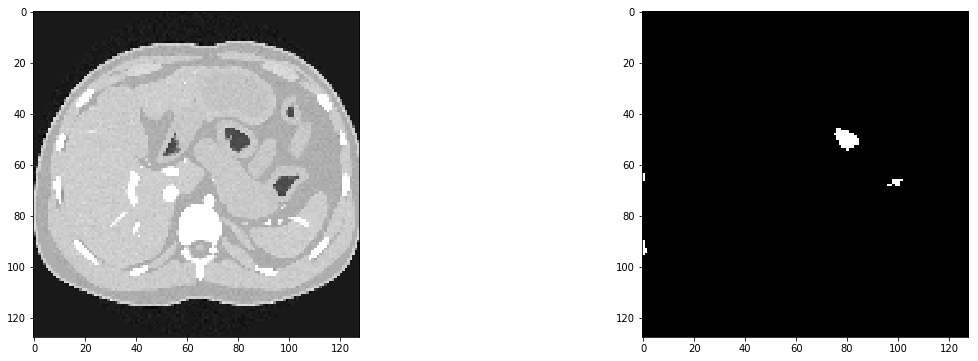

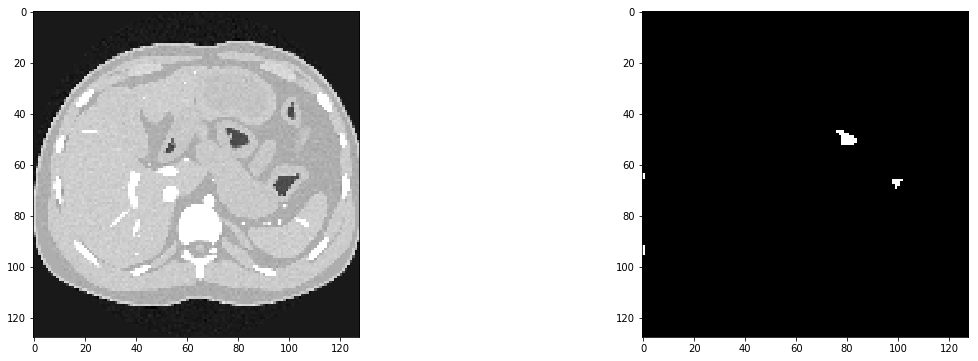

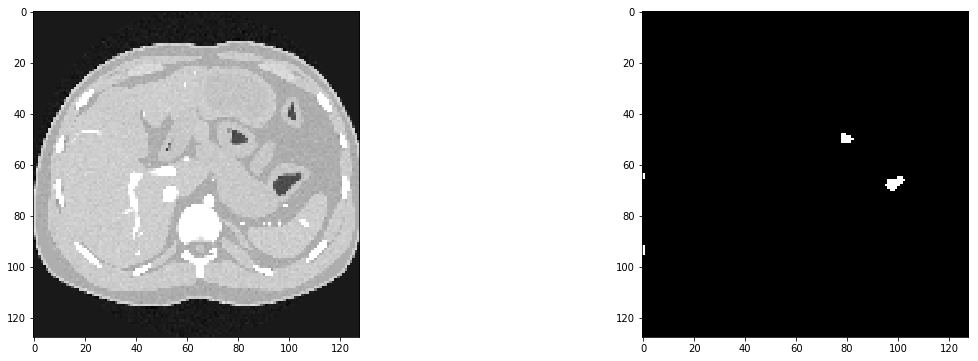

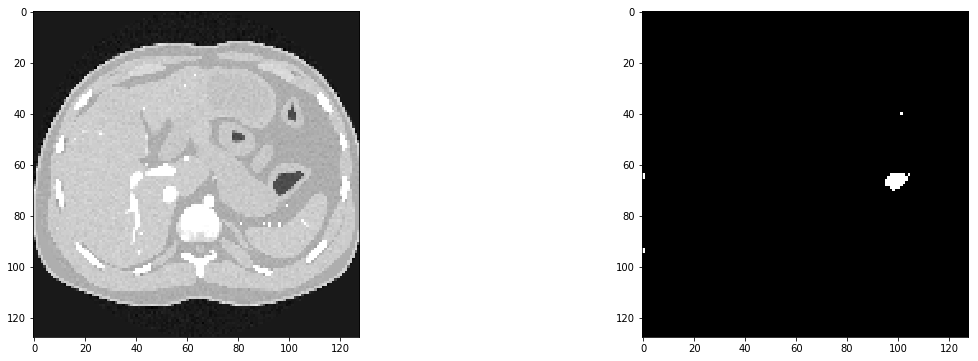

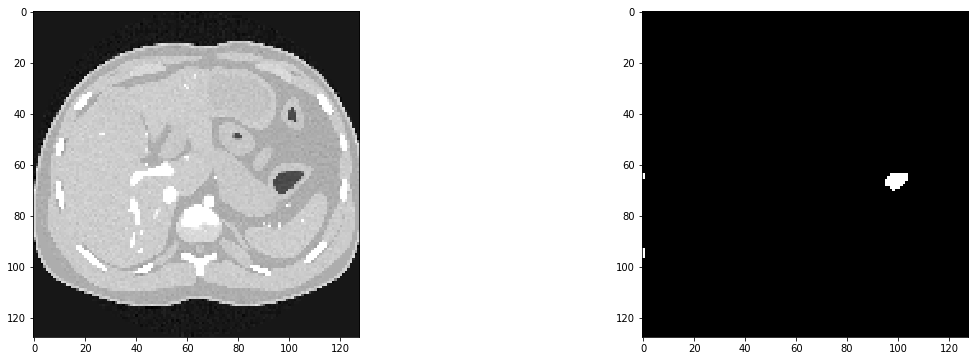

...

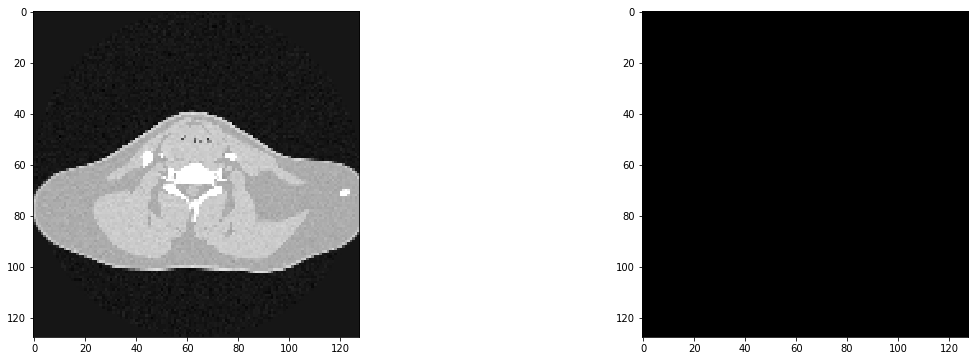

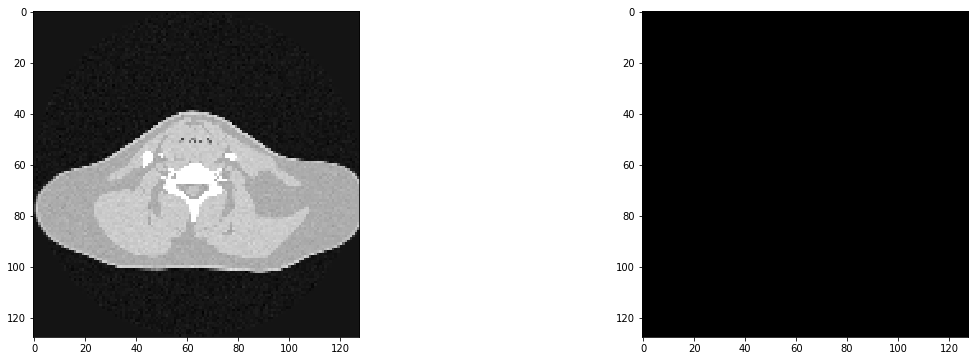

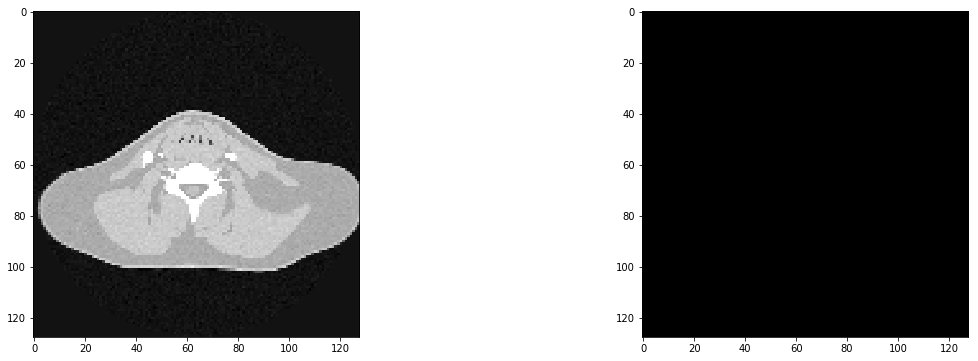

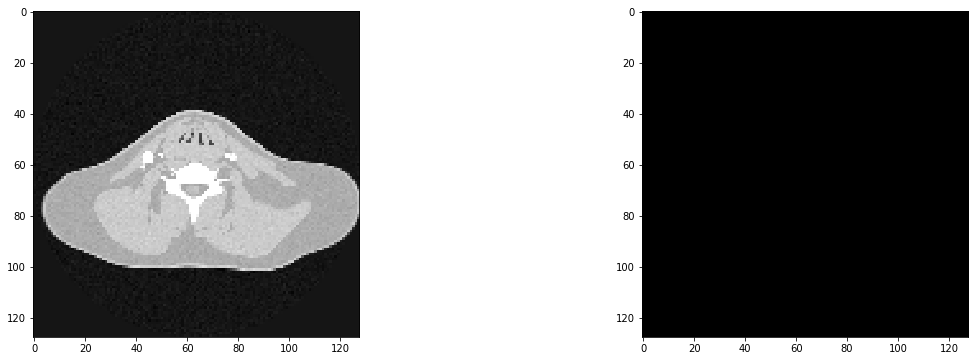

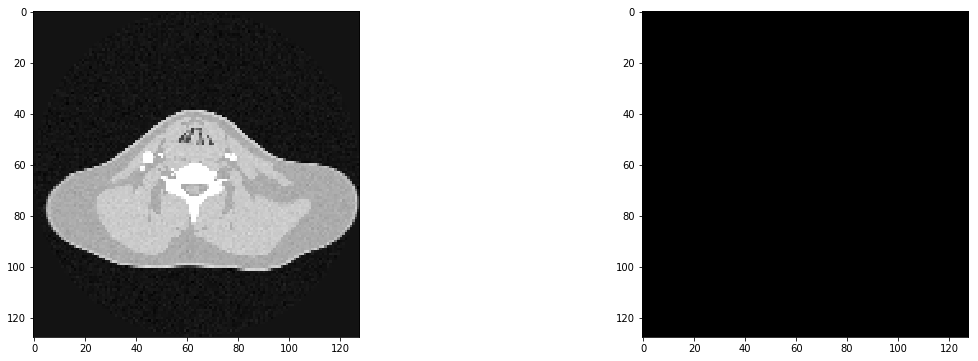

In [17]:

%matplotlib inline
import matplotlib.pyplot as plt

for i in range(len(result)):
    plt.figure(figsize=(20, 6))
    plt.subplot(1, 2, 1)
    plt.imshow(x_test[i,:,:,0],'gray')
    plt.subplot(1, 2, 2)
    plt.imshow(result[i,:,:,0],'gray')
    plt.show()

## 9.실제 정답레이블과 예측mask를 비교하기위해 정답레이블은 파랑색 예측레이블을 빨간색으로 표시해줍니다.

In [18]:
for i in range(y_test.shape[0]):   
    cv2.imwrite("C:/lumic_grandchell_dataset/hey/y_test/y_test[{}].png".format(i), y_test[i])
q = []
for i in range(286):   
    mask = cv2.imread("C:/lumic_grandchell_dataset/hey/y_test/y_test[{}].png".format(i))
    q.append(mask)
print(q[0].shape)

(128, 128, 3)


In [19]:
for i in range(286):   
    cv2.imwrite("C:/lumic_grandchell_dataset/hey/result/result[{}].png".format(i), result[i])
    
a = []
for i in range(286):   
    result_mask = cv2.imread("C:/lumic_grandchell_dataset/hey/result/result[{}].png".format(i))
    a.append(result_mask)

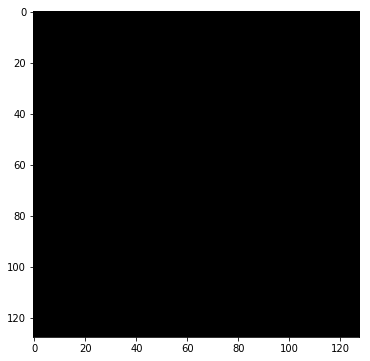

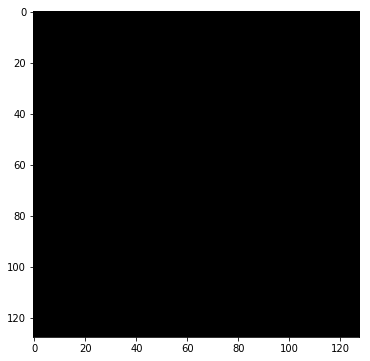

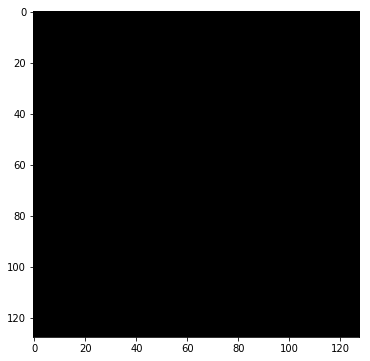

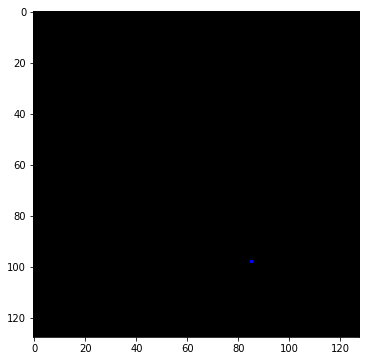

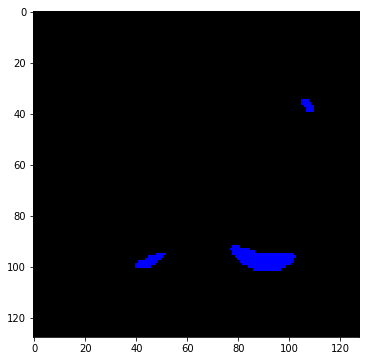

...

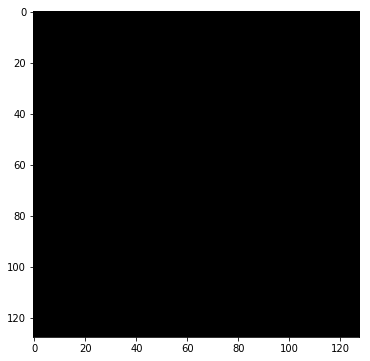

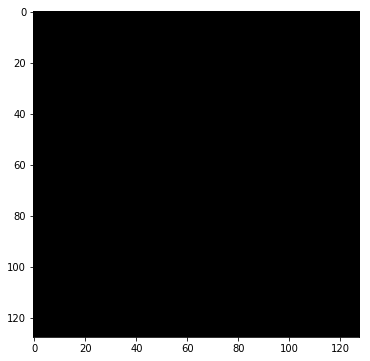

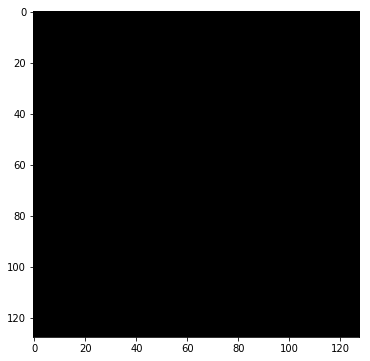

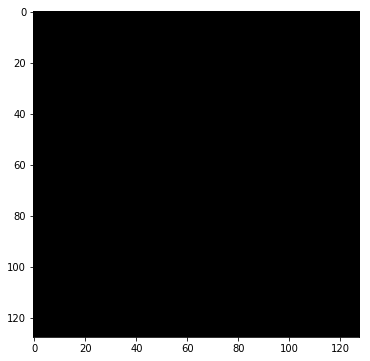

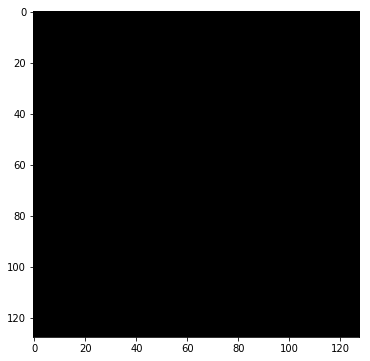

In [22]:
for k in range(286):
    for i in range(128):
        for j in range(128):
            pixel = q[k][i][j]
            if(pixel[0] == 1 and pixel[1] == 1 and pixel[2] == 1):#흰색이면
                pixel[0] = 0    #R
                pixel[1] = 0    #G
                pixel[2] = 255 #B

                
import matplotlib.pyplot as plt
for i in range(0, 286, 10): # 0에서 160까지의 숫자를 10칸 간격으로 추출하겠다는 의미
    plt.figure(figsize=(20, 6))
    plt.subplot(1, 2, 1)
    plt.imshow(q[i])
 
    plt.show()

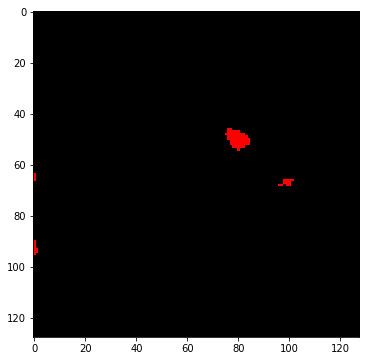

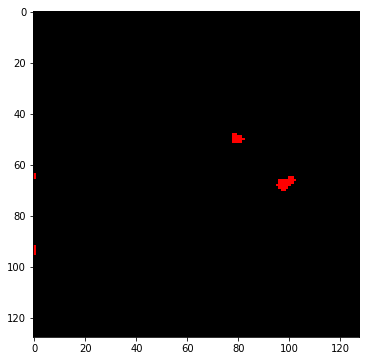

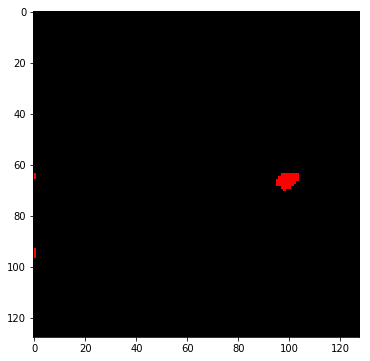

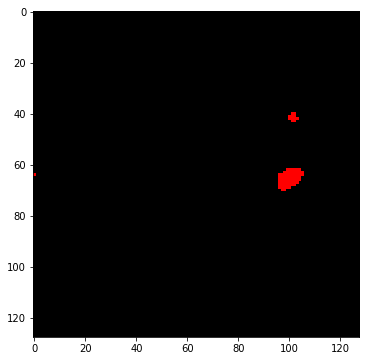

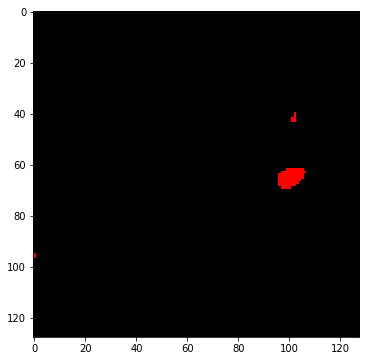

...

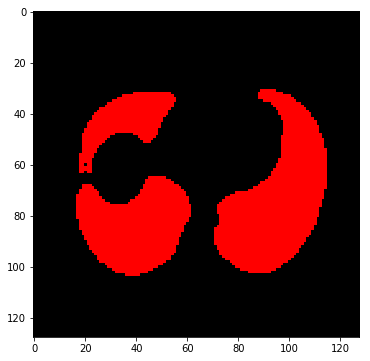

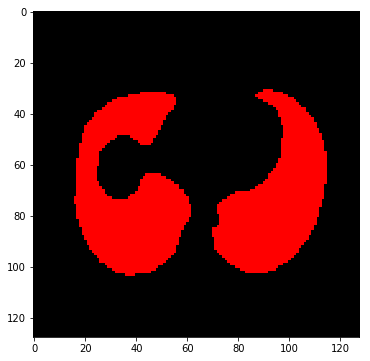

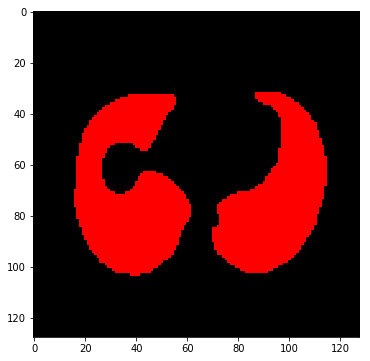

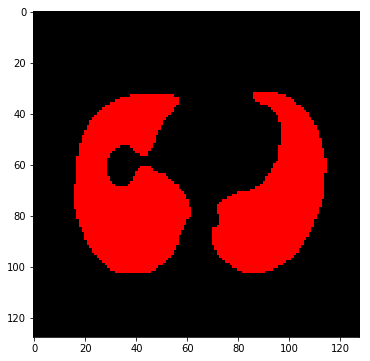

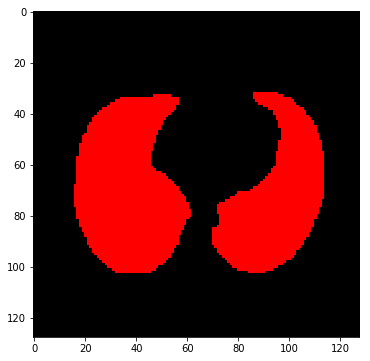

In [21]:
for k in range(286):
    for i in range(128):
        for j in range(128):
            pixel = a[k][i][j]
            if(pixel[0] == 1 and pixel[1] == 1 and pixel[2] == 1):#흰색이면
                pixel[0] = 255    #R
                pixel[1] = 0#G
                pixel[2] = 0 #B

                
import matplotlib.pyplot as plt
for i in range(0, 100, 2): # 0에서 160까지의 숫자를 10칸 간격으로 추출하겠다는 의미
    plt.figure(figsize=(20, 6))
    plt.subplot(1, 2, 1)
    plt.imshow(a[i])
 
    plt.show()

c:\users\juhee\desktop\project\chainsaw_classification\vir_chainsaw\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


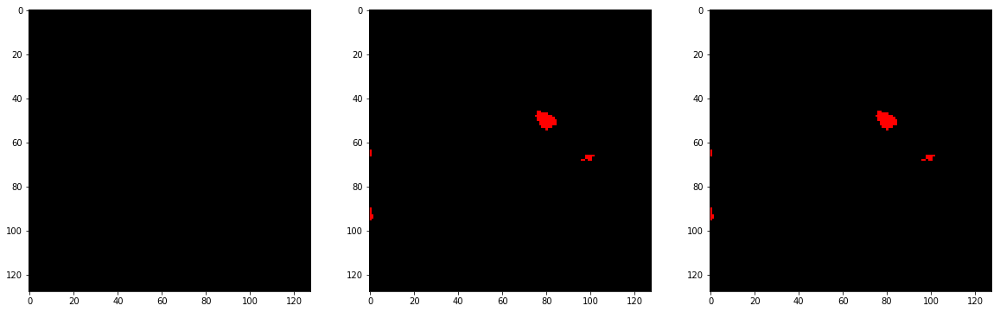

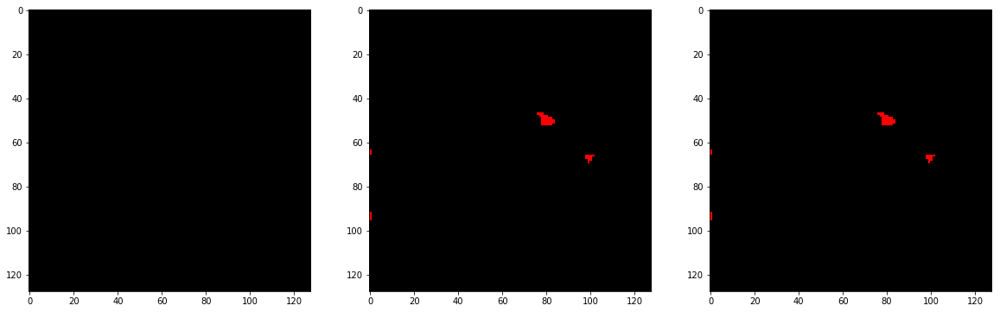

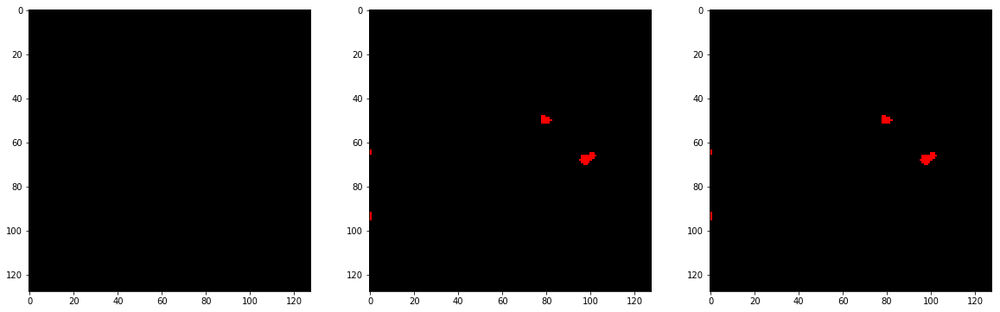

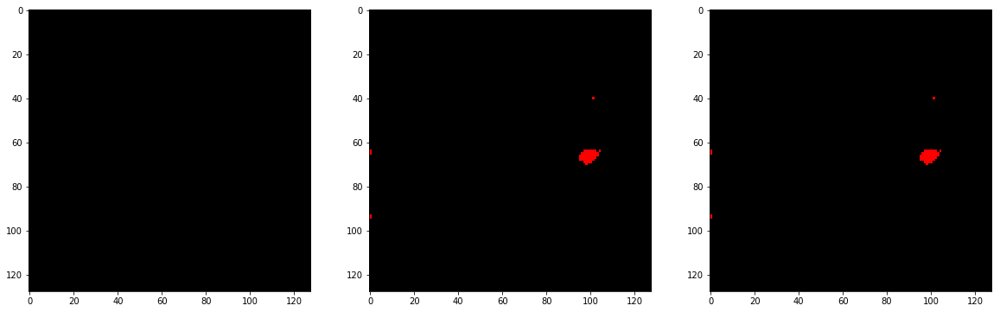

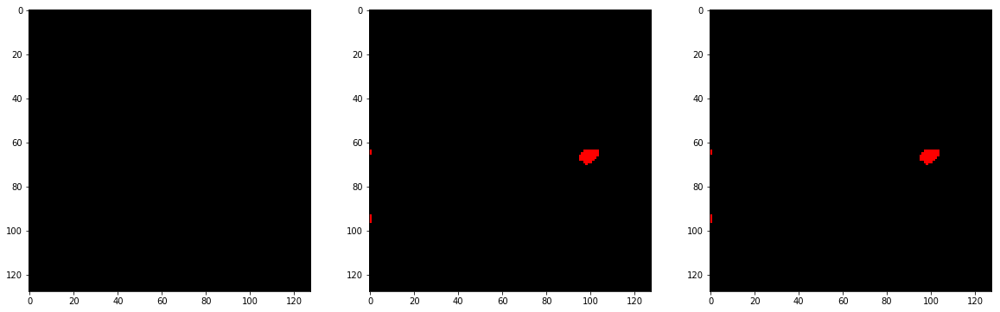

...

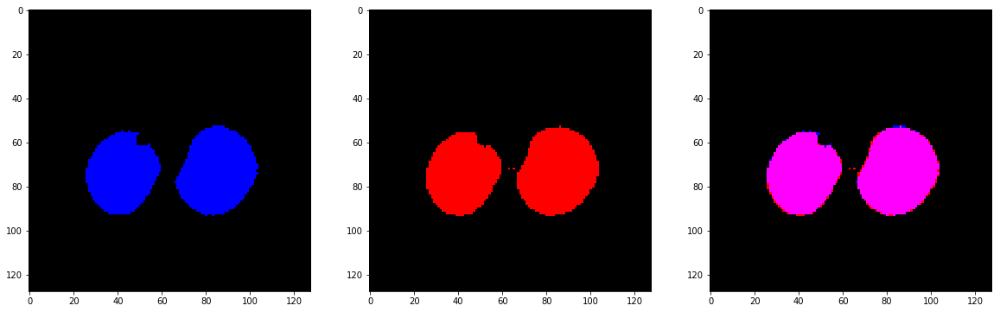

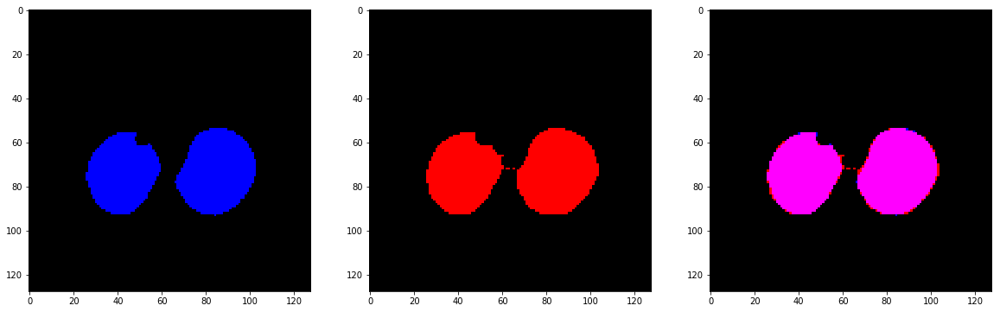

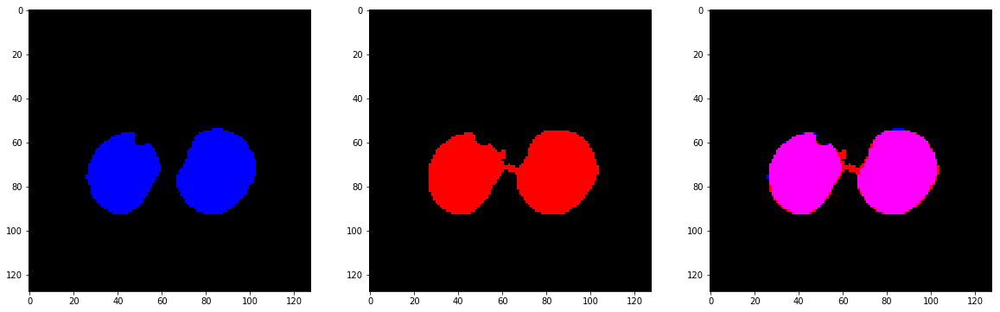

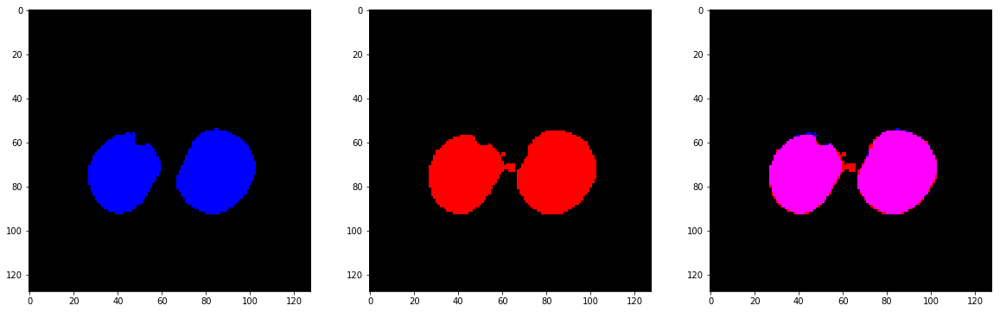

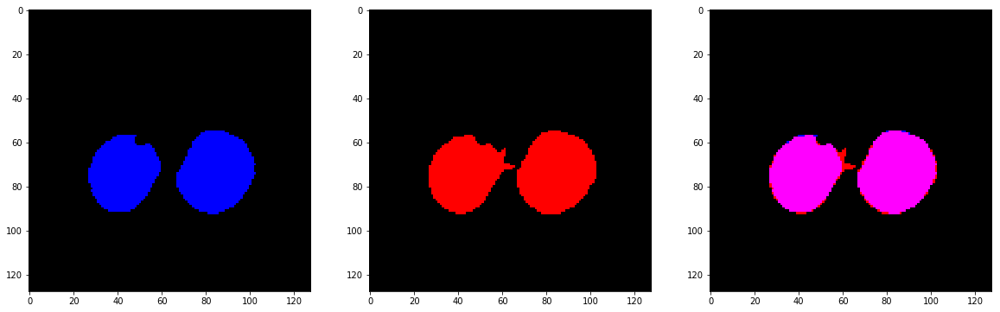

In [23]:
for i in range(200):   
    plt.figure(figsize=(20, 6))
    plt.subplot(1, 3, 1)
    plt.imshow(q[i])
    plt.subplot(1, 3, 2)
    plt.imshow(a[i])
    plt.subplot(1, 3, 3)
    plt.imshow(a[i]+q[i])